In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

In [8]:
data = pd.read_csv('spike_shapes_dataset.csv')
data.dropna(inplace=True)

print(data.isnull().sum())

Neuron         0
Channel        0
Spike_Shape    0
dtype: int64


In [9]:
data = pd.read_csv('spike_shapes_dataset.csv')
print(data.columns)

Index(['Neuron', 'Channel', 'Spike_Shape'], dtype='object')


## Prepare data for PCA

In [10]:
def preprocess_spike_shape(spike_shape_str):
    if spike_shape_str.startswith('['): # If the string starts with '[', remove it
        spike_shape_str = spike_shape_str[1:]
    if spike_shape_str.endswith(']'):  # If the string ends with ']', remove it
        spike_shape_str = spike_shape_str[:-1]
    values = spike_shape_str.split()    # Split the string by whitespace and remove empty strings
    values = [val for val in values if val.strip()]
    return list(map(int, values))

data['Spike_Shape'] = data['Spike_Shape'].apply(preprocess_spike_shape)

max_len = max(data['Spike_Shape'].apply(len))

# Pad spike shapes to ensure equal length
data['Spike_Shape'] = data['Spike_Shape'].apply(lambda x: x + [0]*(max_len - len(x)))

# Convert spike shapes lists to arrays
spike_shapes_array = np.array(data['Spike_Shape'].tolist())

# Standardize the spike shape data
scaler = StandardScaler()
spike_shapes_standardized = scaler.fit_transform(spike_shapes_array)

## Perform PCA

In [11]:
pca = PCA()
pca.fit(spike_shapes_standardized)

explained_variance_ratio = pca.explained_variance_ratio_

## Calculate the cumulative variance ratio

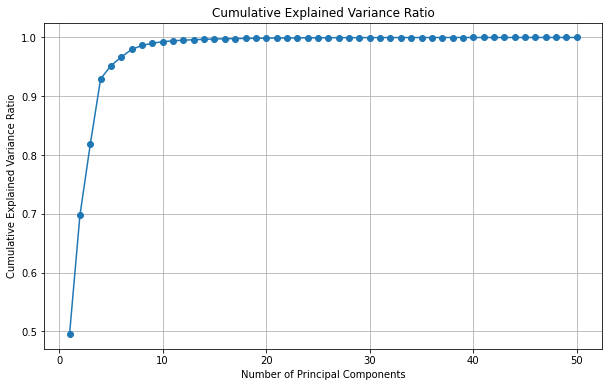

In [12]:
cumulative_explained_variance_ratio = np.cumsum(explained_variance_ratio)

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_explained_variance_ratio) + 1), cumulative_explained_variance_ratio, marker='o', linestyle='-')
plt.title('Cumulative Explained Variance Ratio')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.grid(True)
plt.show()

## insights into the amount of variance explained by each principal component and determining an appropriate number of components to retain based on the desired level of variance explained

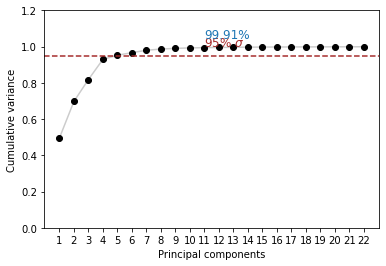

In [13]:
# Define the number of components (the data has 44 features, with even 20 we get 95% variance)
N_components = 22

mypca = PCA(n_components=N_components)
PC = mypca.fit(spike_shapes_standardized)
cumulative_variance_ratio = np.cumsum(mypca.explained_variance_ratio_)

fig, ax = plt.subplots(figsize=(6, 4))
x = np.arange(1, N_components+1, step=1)
y = cumulative_variance_ratio

plt.plot(x, y, '-', color='gray', alpha=0.4)
plt.plot(x, y, 'o', color='k')

plt.ylim(0.0, 1.2)
plt.xlabel('Principal components')
plt.xticks(np.arange(1, N_components+1, step=1))
plt.ylabel('Cumulative variance')

# Add a horizontal line at 95% variance explained
plt.axhline(y=0.95, color='brown', linestyle='--')
plt.text(N_components / 2, 1, '95% $\sigma$', color='brown', fontsize=12)
plt.text(N_components / 2, y[N_components-1] + 0.05, s=f'{y[N_components-1]*100:1.2f}%', color='C0', fontsize=12)
plt.show()

## Elbow graph approach to determine the number of clusters

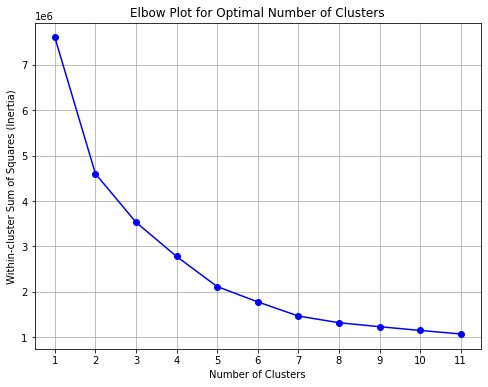

In [14]:
range_n_clusters = range(1, 12) 

inertia_values = []

# Fit KMeans for each cluster number and store the inertia
for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(spike_shapes_standardized)
    inertia_values.append(kmeans.inertia_)

plt.figure(figsize=(8, 6))
plt.plot(range_n_clusters, inertia_values, marker='o', linestyle='-', color='b')
plt.title('Elbow Plot for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Within-cluster Sum of Squares (Inertia)')
plt.xticks(range_n_clusters)
plt.grid(True)
plt.show()

In [15]:
# Fit KMeans for each cluster number and check cluster labels
for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(spike_shapes_standardized)
    print(f"For {n_clusters} clusters, unique labels:", np.unique(cluster_labels))

For 1 clusters, unique labels: [0]
For 2 clusters, unique labels: [0 1]
For 3 clusters, unique labels: [0 1 2]
For 4 clusters, unique labels: [0 1 2 3]
For 5 clusters, unique labels: [0 1 2 3 4]
For 6 clusters, unique labels: [0 1 2 3 4 5]
For 7 clusters, unique labels: [0 1 2 3 4 5 6]
For 8 clusters, unique labels: [0 1 2 3 4 5 6 7]
For 9 clusters, unique labels: [0 1 2 3 4 5 6 7 8]
For 10 clusters, unique labels: [0 1 2 3 4 5 6 7 8 9]
For 11 clusters, unique labels: [ 0  1  2  3  4  5  6  7  8  9 10]


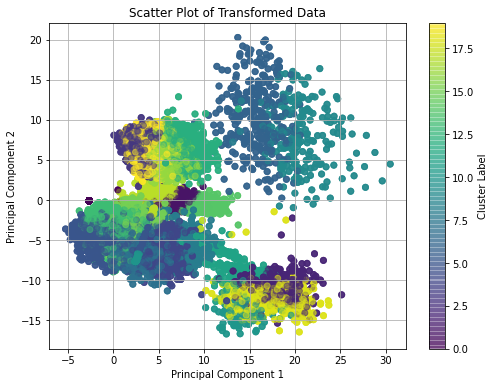

In [16]:
transformed_data = mypca.transform(spike_shapes_standardized)

n_clusters = 20 # based on elbow method choice between 4 or 5 but I'm going to use 20
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(transformed_data)

cluster_labels = kmeans.labels_

plt.figure(figsize=(8, 6))
plt.scatter(transformed_data[:, 0], transformed_data[:, 1], c=cluster_labels, cmap='viridis', alpha=0.5)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Scatter Plot of Transformed Data')
plt.colorbar(label='Cluster Label')
plt.grid(True)
plt.show()

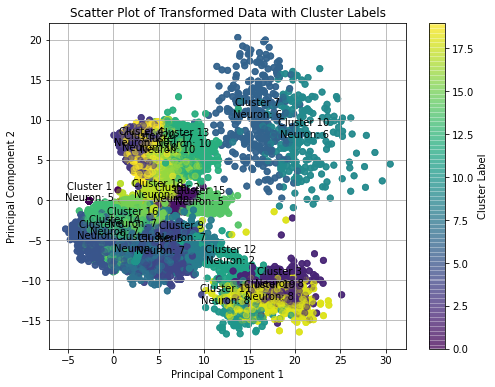

In [17]:
neuron_labels = data['Neuron']

# Plot the scatter plot with labeled clusters
plt.figure(figsize=(8, 6))
scatter = plt.scatter(transformed_data[:, 0], transformed_data[:, 1], c=cluster_labels, cmap='viridis', alpha=0.5)

# Add labels for each cluster with respect to the neurons
for i in range(n_clusters):
    cluster_neuron = neuron_labels[cluster_labels == i]
    cluster_neuron_counts = np.bincount(cluster_neuron)
    dominant_neuron = np.argmax(cluster_neuron_counts)
    plt.text(transformed_data[cluster_labels == i, 0].mean(), 
             transformed_data[cluster_labels == i, 1].mean(), 
             f'Cluster {i+1}\nNeuron: {dominant_neuron}', 
             fontsize=10, ha='center')

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Scatter Plot of Transformed Data with Cluster Labels')
plt.colorbar(scatter, label='Cluster Label')
plt.grid(True)
plt.show()

## Analyse cluster characteristics and visualize centriods

In [18]:
cluster_characteristics = {}
for i in range(n_clusters):
    cluster_indices = np.where(cluster_labels == i)[0]
    spike_shapes_cluster = spike_shapes_standardized[cluster_indices]
    cluster_characteristics[f'Cluster {i+1}'] = {
        'Count': len(cluster_indices),
        'Mean Spike Shape': np.mean(spike_shapes_cluster, axis=0),
        'Std Dev Spike Shape': np.std(spike_shapes_cluster, axis=0)
    }
print("Cluster Characteristics:")
for cluster, characteristics in cluster_characteristics.items():
    print(f"{cluster}: {characteristics}")


Cluster Characteristics:
Cluster 1: {'Count': 108000, 'Mean Spike Shape': array([-0.11884288, -0.10100352, -0.07456242, -0.12270649, -0.17306481,
       -0.22971236, -0.34710425, -0.42101367, -0.46291418, -0.48115256,
       -0.49247426, -0.49593839, -0.50825108, -0.50458228, -0.50005263,
       -0.50244235, -0.50646274, -0.50791527, -0.50886798, -0.48648297,
       -0.33738379,  0.09209267,  0.4785674 ,  0.58166567,  0.58873948,
        0.59150204,  0.59341899,  0.58100012,  0.5096069 ,  0.38973688,
        0.25597443,  0.14164952,  0.04432596, -0.03691913, -0.11554555,
       -0.18502307, -0.23357055, -0.27725013, -0.30325031, -0.31232732,
       -0.31359183, -0.31909513, -0.31603422, -0.32812007, -0.32498668,
       -0.30726321, -0.31130815, -0.30724566, -0.33502114, -0.35883379]), 'Std Dev Spike Shape': array([0.03124718, 0.02066172, 0.01883677, 0.02027143, 0.03209956,
       0.01965276, 0.02369292, 0.0114818 , 0.00877945, 0.00461898,
       0.00875613, 0.00695322, 0.0049476 , 0.00

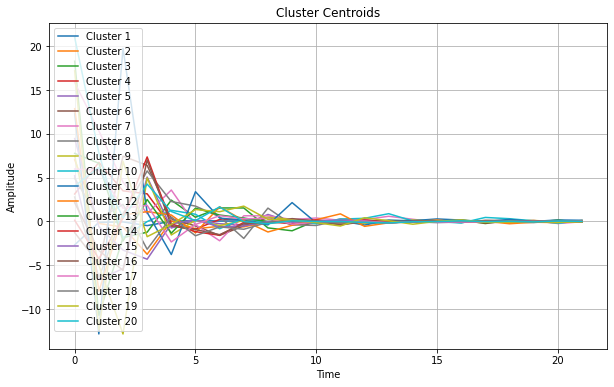

In [19]:
cluster_centers = kmeans.cluster_centers_   # Centroids of the clusters
cluster_labels = kmeans.labels_             # Cluster labels assigned to each data point

plt.figure(figsize=(10, 6))
for i in range(n_clusters):
    plt.plot(cluster_centers[i], label=f'Cluster {i+1}')

plt.title('Cluster Centroids')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()
plt.grid(True)
plt.show()

## Visualize spike shape within each cluster

ValueError: num must be 1 <= num <= 6, not 7

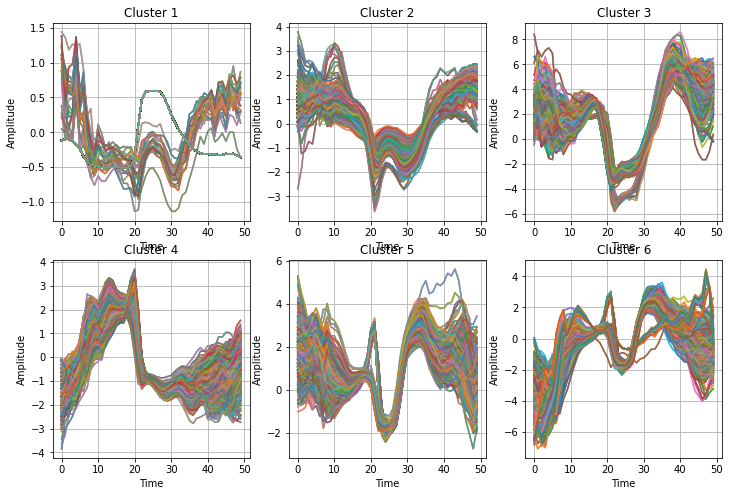

In [20]:
plt.figure(figsize=(12, 8))
for i in range(n_clusters):
    cluster_indices = np.where(cluster_labels == i)[0]
    spike_shapes_cluster = spike_shapes_standardized[cluster_indices]
    plt.subplot(2, 3, i+1)
    for shape in spike_shapes_cluster:
        plt.plot(shape, alpha=0.5)
    plt.title(f'Cluster {i+1}')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.grid(True)

plt.tight_layout()
plt.show()

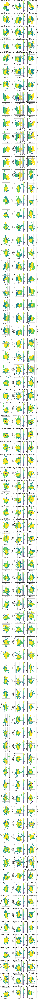

In [31]:
from itertools import combinations

num_components = transformed_data.shape[1]
component_combinations = list(combinations(range(num_components), 2))

num_plots = len(component_combinations)
num_rows = int(np.ceil(num_plots / 3))
num_cols = min(num_plots, 3)

# Plot the data using different combinations of principal components
plt.figure(figsize=(15, 5*num_rows))
for i, (component1, component2) in enumerate(component_combinations, 1):
    plt.subplot(num_rows, num_cols, i)
    plt.scatter(transformed_data[:, component1], transformed_data[:, component2], c=cluster_labels, cmap='viridis', alpha=0.5)
    plt.xlabel(f'Principal Component {component1 + 1}')
    plt.ylabel(f'Principal Component {component2 + 1}')
    plt.title(f'Scatter Plot of Transformed Data (Components {component1 + 1} vs. {component2 + 1})')
    plt.colorbar(label='Cluster Label')
    plt.grid(True)

plt.tight_layout()
plt.show()